In [ ]:
# !pip uninstall tensorflow tensorflow-cpu tensorflow-gpu tensorrt -y -q
# !pip install tensorflow==2.17.0 -q --no-cache-dir
# !pip install --upgrade ml_dtypes -q

In [2]:
import tensorflow as tf
print(tf.__version__)  # Phải in ra 2.17.0
print(tf.config.list_physical_devices('GPU'))  # Phải thấy GPU T4

2.19.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [3]:
import os
import h5py
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import cv2
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.ndimage import gaussian_filter
import warnings
warnings.filterwarnings('ignore')
from tensorflow.keras.utils import Sequence

tf.config.optimizer.set_jit(False)
tf.get_logger().setLevel('ERROR')

In [5]:
# Cài dlib (chạy tốt trên Kaggle GPU)
!pip install -q dlib

# Tải file shape predictor 68 điểm
import urllib.request
import bz2
import os

url = "http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2"
predictor_path = "shape_predictor_68_face_landmarks.dat.bz2"
extracted_path = "shape_predictor_68_face_landmarks.dat"

if not os.path.exists(extracted_path):
    print("Đang tải shape_predictor_68_face_landmarks.dat.bz2...")
    urllib.request.urlretrieve(url, predictor_path)
    
    print("Đang giải nén...")
    with bz2.BZ2File(predictor_path) as fr, open(extracted_path, "wb") as fw:
        fw.write(fr.read())
    print("Hoàn tất!")
else:
    print("File predictor đã tồn tại.")

File predictor đã tồn tại.


In [6]:
# ============================================================================
# CONFIGURATION - ĐÃ TỐI ƯU HÓA
# ============================================================================
class Config:
    # Paths
    CELEBA_PATH = '/kaggle/input/celebahq-resized-256x256/celeba_hq_256'
    OUTPUT_DIR = '/kaggle/working/outputs'
    WEIGHTS_DIR = '/kaggle/working/weights'
    
    # Image settings - GIẢM KÍCH THƯỚC
    IMG_SIZE = 128  # Giảm từ 256 → 128 (giảm 4x params)
    CHANNELS = 3
    
    # Training settings
    BATCH_SIZE = 32  # Tăng batch size nhờ model nhẹ hơn
    EPOCHS_INPAINTING = 15
    LEARNING_RATE_G = 0.0002
    LEARNING_RATE_D = 0.0004
    
    # Loss weights - ĐƠN GIẢN HÓA
    WEIGHT_ADV = 1.0
    WEIGHT_L1 = 100.0  # Tăng L1, giảm perceptual
    WEIGHT_PERCEPTUAL = 0.1  # Giảm từ 0.5
    WEIGHT_MASKED = 50.0
    
    # Dataset
    MAX_IMAGES = 30000
    
    os.makedirs(OUTPUT_DIR, exist_ok=True)
    os.makedirs(WEIGHTS_DIR, exist_ok=True)

config = Config()

In [7]:
# ============================================================================
# LANDMARK DETECTION MODULE - GIỮ NGUYÊN
# ============================================================================
class LandmarkDetector:
    def __init__(self):
        try:
            import dlib
            self.detector = dlib.get_frontal_face_detector()
            self.predictor = dlib.shape_predictor(
                'shape_predictor_68_face_landmarks.dat'
            )
            self.use_dlib = True
        except:
            print("⚠️ Dlib not available, using approximation")
            self.use_dlib = False
    
    def detect(self, image):
        if self.use_dlib:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            faces = self.detector(gray)
            if len(faces) > 0:
                shape = self.predictor(gray, faces[0])
                landmarks = np.array([[p.x, p.y] for p in shape.parts()])
                return landmarks
        return self._generate_approximate_landmarks(image.shape[0], image.shape[1])
    
    def _generate_approximate_landmarks(self, h, w):
        landmarks = []
        # Face contour (0-16)
        for i in range(17):
            x = int(w * (0.15 + 0.7 * i / 16))
            y = int(h * (0.25 + 0.5 * np.sin(i * np.pi / 16)))
            landmarks.append([x, y])
        # Eyebrows (17-26)
        for i in range(5):
            landmarks.append([int(w * (0.25 + 0.1 * i / 4)), int(h * 0.35)])
        for i in range(5):
            landmarks.append([int(w * (0.6 + 0.1 * i / 4)), int(h * 0.35)])
        # Nose (27-35)
        for i in range(9):
            landmarks.append([int(w * 0.5), int(h * (0.45 + 0.15 * i / 8))])
        # Eyes (36-47)
        eye_left_center = (int(w * 0.35), int(h * 0.45))
        for i in range(6):
            angle = i * np.pi / 3
            x = eye_left_center[0] + int(w * 0.05 * np.cos(angle))
            y = eye_left_center[1] + int(h * 0.03 * np.sin(angle))
            landmarks.append([x, y])
        eye_right_center = (int(w * 0.65), int(h * 0.45))
        for i in range(6):
            angle = i * np.pi / 3
            x = eye_right_center[0] + int(w * 0.05 * np.cos(angle))
            y = eye_right_center[1] + int(h * 0.03 * np.sin(angle))
            landmarks.append([x, y])
        # Mouth (48-67)
        mouth_center = (int(w * 0.5), int(h * 0.75))
        for i in range(20):
            if i < 12:
                angle = i * 2 * np.pi / 12
                radius = w * 0.12
            else:
                angle = (i - 12) * 2 * np.pi / 8
                radius = w * 0.08
            x = mouth_center[0] + int(radius * np.cos(angle))
            y = mouth_center[1] + int(radius * 0.5 * np.sin(angle))
            landmarks.append([x, y])
        return np.array(landmarks, dtype=np.float32)

In [8]:
# ============================================================================
# PRIOR GENERATION - TỐI ƯU HÓA
# ============================================================================
class PriorGenerator:
    def __init__(self, img_size=128):
        self.img_size = img_size
    
    def landmarks_to_heatmap(self, landmarks):
        heatmap = np.zeros((self.img_size, self.img_size), dtype=np.float32)
        sigma = 2.0  # Giảm từ 3.0
        
        for i in range(len(landmarks)):
            x, y = int(landmarks[i][0]), int(landmarks[i][1])
            if 0 <= x < self.img_size and 0 <= y < self.img_size:
                # Giảm kích thước kernel
                xx, yy = np.meshgrid(
                    np.arange(max(0, x-10), min(self.img_size, x+11)),
                    np.arange(max(0, y-10), min(self.img_size, y+11))
                )
                gaussian = np.exp(-((xx - x)**2 + (yy - y)**2) / (2 * sigma**2))
                
                y1, y2 = max(0, y-10), min(self.img_size, y+11)
                x1, x2 = max(0, x-10), min(self.img_size, x+11)
                heatmap[y1:y2, x1:x2] = np.maximum(
                    heatmap[y1:y2, x1:x2], gaussian
                )
        return heatmap[..., np.newaxis]
    
    def create_edge_map(self, landmarks):
        edge_map = np.zeros((self.img_size, self.img_size), dtype=np.uint8)
        contours = [
            list(range(0, 17)), list(range(17, 22)), list(range(22, 27)),
            list(range(27, 36)), list(range(36, 42)), list(range(42, 48)),
            list(range(48, 60)), list(range(60, 68)),
        ]
        for contour in contours:
            pts = landmarks[contour].astype(np.int32)
            cv2.polylines(edge_map, [pts], False, 255, 1)  # Giảm thickness
            if len(contour) in [6, 12, 8]:
                cv2.line(edge_map, tuple(pts[0]), tuple(pts[-1]), 255, 1)
        edge_map = gaussian_filter(edge_map.astype(np.float32), sigma=1.0)
        return (edge_map / 255.0)[..., np.newaxis]
    
    def mask_to_segmentation(self, mask):
        face_region = (mask < 128).astype(np.float32)
        mask_region = (mask >= 128).astype(np.float32)
        face_region = gaussian_filter(face_region, sigma=1.5)
        mask_region = gaussian_filter(mask_region, sigma=1.5)
        return np.stack([face_region, mask_region], axis=-1)
    
    def generate_all_priors(self, landmarks, mask):
        landmark_heatmap = self.landmarks_to_heatmap(landmarks)
        edge_map = self.create_edge_map(landmarks)
        segmentation = self.mask_to_segmentation(mask)
        return np.concatenate([landmark_heatmap, edge_map, segmentation], axis=-1)

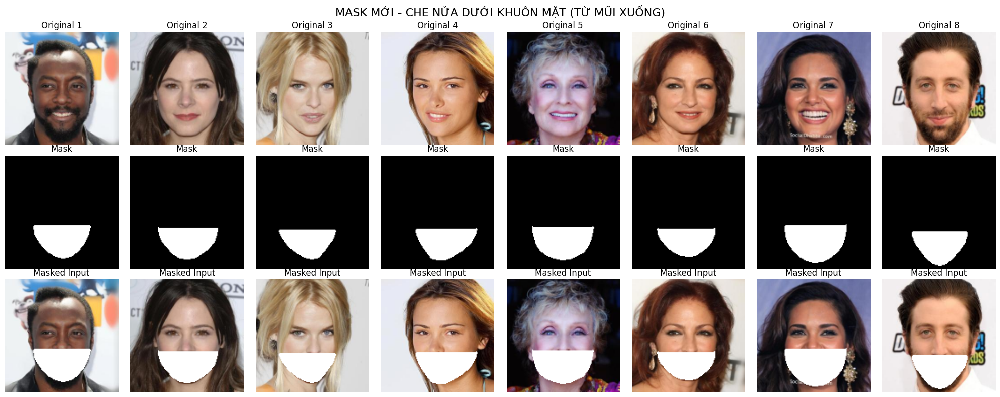

In [10]:

import numpy as np
import cv2

class MaskGenerator:
    def __init__(self, img_size=128):
        self.img_size = img_size

    def generate_mask(self, image, landmarks=None):
        """
        Tạo mask che NỬA DƯỚI KHUÔN MẶT (từ mũi xuống cằm).
        
        Args:
            image: ảnh gốc (H, W, 3)
            landmarks: array (68, 2) - ĐÃ SCALE về đúng img_size
        
        Returns:
            mask: np.uint8 (H, W), giá trị 255 ở vùng bị che
        """
        h, w = self.img_size, self.img_size
        mask = np.zeros((h, w), dtype=np.uint8)

        if landmarks is not None:
            # ===== ĐẢMBẢO LANDMARKS ĐÚNG SCALE =====
            # Nếu landmarks > img_size thì scale về
            if landmarks.max() > self.img_size:
                scale_factor = self.img_size / landmarks.max()
                landmarks = landmarks * scale_factor
            
            # Clip để đảm bảo trong bounds
            landmarks[:, 0] = np.clip(landmarks[:, 0], 0, w-1)
            landmarks[:, 1] = np.clip(landmarks[:, 1], 0, h-1)
            
            # ===== TÌM RANH GIỚI (ĐƯỜNG NGANG QUA MŨI) =====
            # Landmarks mũi: 27-35
            # - 27-30: cầu mũi
            # - 31-35: đáy mũi (2 bên + giữa)
            
            # Lấy điểm ở GIỮA MŨI (không quá cao, không quá thấp)
            nose_bridge = landmarks[30]  # Điểm cuối cầu mũi
            nose_tip = landmarks[33]     # Điểm đầu mũi
            
            # Ranh giới: giữa 2 điểm này (khoảng 55-60% khuôn mặt từ trên xuống)
            boundary_y = int((nose_bridge[1] + nose_tip[1]) / 2)
            
            # ===== CÁCH 1: SIMPLE POLYGON (ĐƠN GIẢN, HIỆU QUẢ) =====
            # Tạo polygon từ: jawline dưới + đường ngang qua mũi
            
            jawline = landmarks[0:17]  # 17 điểm từ trái qua phải
            
            polygon_points = []
            
            # Tìm điểm JAW bên TRÁI gần boundary_y nhất
            for i in range(9):  # Nửa trái của jaw (0-8)
                if jawline[i, 1] >= boundary_y:
                    polygon_points.append([int(jawline[i, 0]), int(boundary_y)])
                    break
            
            # Nếu không tìm thấy, dùng điểm ngoài cùng
            if len(polygon_points) == 0:
                polygon_points.append([int(jawline[0, 0]), int(boundary_y)])
            
            # Đi xuống theo JAWLINE (chỉ lấy phần dưới boundary_y)
            for pt in jawline:
                if pt[1] >= boundary_y - 5:  # -5 để overlap một chút
                    polygon_points.append([int(pt[0]), int(pt[1])])
            
            # Tìm điểm JAW bên PHẢI gần boundary_y
            for i in range(16, 7, -1):  # Nửa phải của jaw (16-8)
                if jawline[i, 1] >= boundary_y:
                    polygon_points.append([int(jawline[i, 0]), int(boundary_y)])
                    break
            
            # Nếu không tìm thấy, dùng điểm ngoài cùng
            if polygon_points[-1][1] < boundary_y:
                polygon_points.append([int(jawline[16, 0]), int(boundary_y)])
            
            # Vẽ polygon
            if len(polygon_points) >= 3:
                polygon_points = np.array(polygon_points, dtype=np.int32)
                cv2.fillPoly(mask, [polygon_points], 255)
            
            # ===== BỔ SUNG: ĐẢM BẢO CHE KÍN VÙNG MIỆNG + CẰM =====
            # Miệng outer: 48-59
            mouth_outer = landmarks[48:60].astype(np.int32)
            cv2.fillPoly(mask, [mouth_outer], 255)
            
            # Miệng inner: 60-67 (optional, để che kín hơn)
            mouth_inner = landmarks[60:68].astype(np.int32)
            cv2.fillPoly(mask, [mouth_inner], 255)
            
            # Vùng cằm: từ jaw dưới (5-11) + miệng dưới (54-57)
            chin_region = []
            for i in range(4, 13):  # Jaw từ 4-12 (phần dưới)
                chin_region.append([int(jawline[i, 0]), int(jawline[i, 1])])
            # Nối với miệng dưới
            for i in [57, 58, 59, 48, 54, 55, 56]:
                chin_region.append([int(landmarks[i, 0]), int(landmarks[i, 1])])
            
            if len(chin_region) >= 3:
                chin_region = np.array(chin_region, dtype=np.int32)
                cv2.fillPoly(mask, [chin_region], 255)
            
        else:
            # Fallback: không có landmarks
            # Tạo ellipse ở nửa dưới
            center_x = w // 2
            center_y = int(h * 0.65)
            axes = (int(w * 0.3), int(h * 0.2))
            cv2.ellipse(mask, (center_x, center_y), axes, 0, 0, 360, 255, -1)

        # Làm mịn viền
        mask = cv2.GaussianBlur(mask, (7, 7), 0)
        _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

        return mask



# ============================================================================
# KIỂM TRA MASK MỚI
# ============================================================================
if __name__ == "__main__":
    import matplotlib.pyplot as plt
    from glob import glob
    import os
    
    # Giả sử bạn đã có config và LandmarkDetector
    # config.CELEBA_PATH = '/kaggle/input/celebahq-resized-256x256/celeba_hq_256'
    # config.IMG_SIZE = 128
    
    image_paths = glob(os.path.join(config.CELEBA_PATH, '*.jpg'))[:8]
    
    mask_generator = MaskGenerator(img_size=config.IMG_SIZE)
    landmark_detector = LandmarkDetector()
    
    fig, axs = plt.subplots(3, 8, figsize=(20, 8))
    fig.suptitle('MASK MỚI - CHE NỬA DƯỚI KHUÔN MẶT (TỪ MŨI XUỐNG)', fontsize=16)
    
    for i, path in enumerate(image_paths):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (config.IMG_SIZE, config.IMG_SIZE))
        
        landmarks = landmark_detector.detect(img)
        
        # Scale landmarks nếu cần (từ 256 -> 128)
        if landmarks.max() > config.IMG_SIZE:
            landmarks = landmarks * (config.IMG_SIZE / 256)
        
        mask = mask_generator.generate_mask(img, landmarks)
        
        # Apply mask
        masked_img = img.copy()
        binary_mask = (mask / 255.0)[..., np.newaxis]
        masked_img = (img * (1 - binary_mask)).astype(np.uint8) + \
                     (255 * binary_mask).astype(np.uint8)
        
        # Visualize
        axs[0, i].imshow(img)
        axs[0, i].set_title(f'Original {i+1}')
        axs[0, i].axis('off')
        
        axs[1, i].imshow(mask, cmap='gray')
        axs[1, i].set_title('Mask')
        axs[1, i].axis('off')
        
        axs[2, i].imshow(masked_img)
        axs[2, i].set_title('Masked Input')
        axs[2, i].axis('off')
    
    plt.tight_layout()
    plt.show()


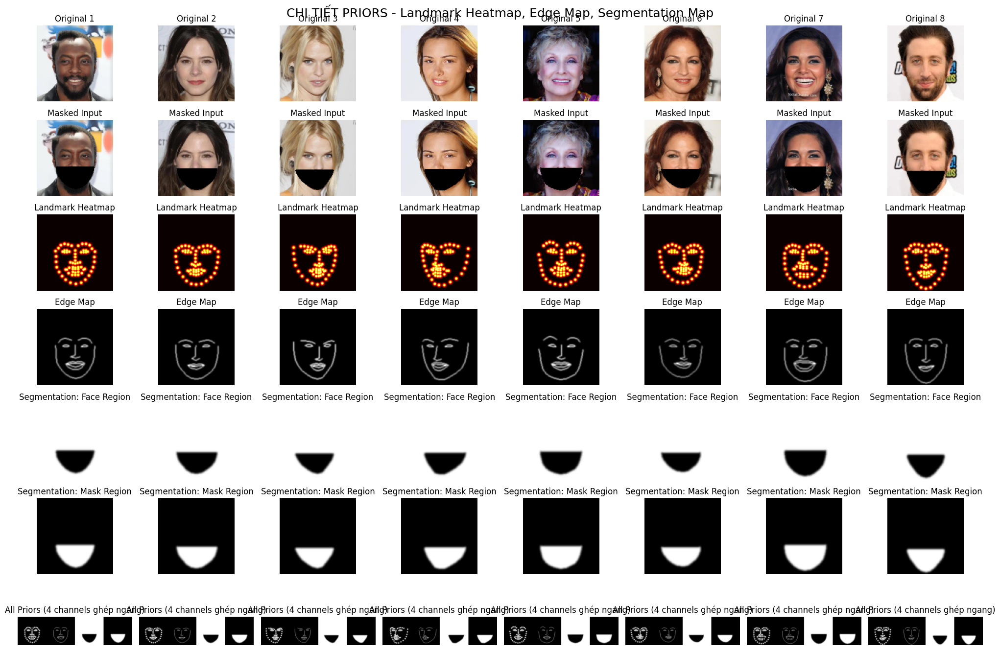

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from glob import glob

# ================== CÀI ĐẶT ==================
num_samples = 8  # Số ảnh muốn visualize
image_paths = glob(os.path.join(config.CELEBA_PATH, '*.jpg'))[:num_samples]

# Khởi tạo các class cần thiết
landmark_detector = LandmarkDetector()
prior_generator = PriorGenerator(img_size=config.IMG_SIZE)
mask_generator = MaskGenerator(img_size=config.IMG_SIZE)  # class bạn vừa sửa

# ================== VISUALIZE ==================
fig, axs = plt.subplots(7, num_samples, figsize=(num_samples * 2.5, 14))
fig.suptitle('CHI TIẾT PRIORS - Landmark Heatmap, Edge Map, Segmentation Map', fontsize=18, y=0.98)

for idx, path in enumerate(image_paths):
    # Load và preprocess ảnh
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (config.IMG_SIZE, config.IMG_SIZE))
    
    # Detect landmarks
    landmarks = landmark_detector.detect(img_resized)
    
    # Tạo mask (che vùng miệng)
    mask = mask_generator.generate_mask(img_resized, landmarks)
    
    # Tạo các priors riêng lẻ
    landmark_heatmap = prior_generator.landmarks_to_heatmap(landmarks)  # shape (128,128,1)
    edge_map = prior_generator.create_edge_map(landmarks)              # shape (128,128,1)
    segmentation = prior_generator.mask_to_segmentation(mask)           # shape (128,128,2)
    
    # Ghép tất cả priors lại (dùng để kiểm tra input cuối cùng cho generator)
    all_priors = prior_generator.generate_all_priors(landmarks, mask)   # shape (128,128,4)
    
    # Áp mask lên ảnh gốc để thấy masked input (RGB phần giữ nguyên, vùng mask = 0)
    binary_mask = (mask / 255.0)[..., np.newaxis]
    masked_img = img_resized * (1 - binary_mask)
    
    # Visualize từng cột (mỗi ảnh)
    axs[0, idx].imshow(img_resized)
    axs[0, idx].set_title(f'Original {idx+1}')
    axs[0, idx].axis('off')
    
    axs[1, idx].imshow(masked_img.astype(np.uint8))
    axs[1, idx].set_title('Masked Input')
    axs[1, idx].axis('off')
    
    axs[2, idx].imshow(landmark_heatmap.squeeze(), cmap='hot')
    axs[2, idx].set_title('Landmark Heatmap')
    axs[2, idx].axis('off')
    
    axs[3, idx].imshow(edge_map.squeeze(), cmap='gray')
    axs[3, idx].set_title('Edge Map')
    axs[3, idx].axis('off')
    
    axs[4, idx].imshow(segmentation[..., 0], cmap='gray')  # face region
    axs[4, idx].set_title('Segmentation: Face Region')
    axs[4, idx].axis('off')
    
    axs[5, idx].imshow(segmentation[..., 1], cmap='gray')  # mask region
    axs[5, idx].set_title('Segmentation: Mask Region')
    axs[5, idx].axis('off')
    
    # Hiển thị 4 channels priors ghép (mỗi channel riêng để dễ nhìn)
    prior_combined = np.concatenate([
        landmark_heatmap.squeeze(),
        edge_map.squeeze(),
        segmentation[..., 0],
        segmentation[..., 1]
    ], axis=1)  # ghép ngang 4 kênh
    axs[6, idx].imshow(prior_combined, cmap='gray')
    axs[6, idx].set_title('All Priors (4 channels ghép ngang)')
    axs[6, idx].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

In [13]:
# ============================================================================
# LIGHTWEIGHT GENERATOR - GIẢM SÂU 50% PARAMETERS
# ============================================================================
def build_lightweight_generator(input_shape=(128, 128, 7)):
    """
    Generator nhẹ hơn với:
    - Giảm số filters: 64→32, 128→64, 256→128, 512→256
    - Giảm độ sâu: 5 encoder layers → 4 layers
    - Sử dụng Separable Conv để giảm params
    """
    inputs = layers.Input(shape=input_shape, name='input')
    
    # === ENCODER ===
    # Layer 1: 128x128x7 → 128x128x32
    img_conv = layers.Conv2D(32, 5, padding='same')(inputs[..., :3])
    img_conv = layers.BatchNormalization()(img_conv)
    img_conv = layers.ReLU()(img_conv)
    
    prior_conv = layers.Conv2D(16, 5, padding='same')(inputs[..., 3:])
    prior_conv = layers.BatchNormalization()(prior_conv)
    prior_conv = layers.ReLU()(prior_conv)
    
    e1 = layers.Concatenate()([img_conv, prior_conv])  # 48 channels
    
    # Layer 2: 128x128 → 64x64x64
    e2 = layers.SeparableConv2D(64, 4, strides=2, padding='same')(e1)
    e2 = layers.BatchNormalization()(e2)
    e2 = layers.ReLU()(e2)
    
    # Layer 3: 64x64 → 32x32x128
    e3 = layers.SeparableConv2D(128, 4, strides=2, padding='same')(e2)
    e3 = layers.BatchNormalization()(e3)
    e3 = layers.ReLU()(e3)
    
    # Layer 4: 32x32 → 16x16x256
    e4 = layers.SeparableConv2D(256, 4, strides=2, padding='same')(e3)
    e4 = layers.BatchNormalization()(e4)
    e4 = layers.ReLU()(e4)
    
    # Bottleneck: 16x16 → 8x8x256
    b = layers.SeparableConv2D(256, 4, strides=2, padding='same')(e4)
    b = layers.BatchNormalization()(b)
    b = layers.ReLU()(b)
    
    # === DECODER ===
    # 8x8 → 16x16x256
    d1 = layers.Conv2DTranspose(256, 4, strides=2, padding='same')(b)
    d1 = layers.BatchNormalization()(d1)
    d1 = layers.Dropout(0.3)(d1)
    d1 = layers.Concatenate()([d1, e4])
    d1 = layers.ReLU()(d1)
    
    # 16x16 → 32x32x128
    d2 = layers.Conv2DTranspose(128, 4, strides=2, padding='same')(d1)
    d2 = layers.BatchNormalization()(d2)
    d2 = layers.Concatenate()([d2, e3])
    d2 = layers.ReLU()(d2)
    
    # 32x32 → 64x64x64
    d3 = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(d2)
    d3 = layers.BatchNormalization()(d3)
    d3 = layers.Concatenate()([d3, e2])
    d3 = layers.ReLU()(d3)
    
    # 64x64 → 128x128x48
    d4 = layers.Conv2DTranspose(48, 4, strides=2, padding='same')(d3)
    d4 = layers.BatchNormalization()(d4)
    d4 = layers.Concatenate()([d4, e1])
    d4 = layers.ReLU()(d4)
    
    # Output: 128x128x3
    outputs = layers.Conv2D(3, 5, padding='same', activation='tanh')(d4)
    
    model = keras.Model(inputs, outputs, name='lightweight_generator')
    return model

In [14]:
# ============================================================================
# LIGHTWEIGHT DISCRIMINATOR - GIẢM 60% PARAMETERS
# ============================================================================
def build_lightweight_discriminator(input_shape=(128, 128, 3)):
    """PatchGAN nhẹ với Separable Conv"""
    inputs = layers.Input(shape=input_shape)
    
    # 128x128 → 64x64x32
    x = layers.Conv2D(32, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    
    # 64x64 → 32x32x64
    x = layers.SeparableConv2D(64, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    # 32x32 → 16x16x128
    x = layers.SeparableConv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    # 16x16 → 16x16x256
    x = layers.SeparableConv2D(256, 4, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    # Output
    outputs = layers.Conv2D(1, 4, padding='same')(x)
    
    model = keras.Model(inputs, outputs, name='lightweight_discriminator')
    return model

In [15]:
# ============================================================================
# SIMPLIFIED PERCEPTUAL LOSS - CHỈ DÙNG 1 LAYER
# ============================================================================
class LightweightPerceptualLoss:
    def __init__(self):
        vgg = keras.applications.VGG16(
            include_top=False, weights='imagenet', 
            input_shape=(128, 128, 3)
        )
        vgg.trainable = False
        # Chỉ dùng 1 layer thay vì 3
        output = vgg.get_layer('block3_conv3').output
        self.model = keras.Model(vgg.input, output)
    
    def __call__(self, y_true, y_pred):
        # Resize nếu cần
        y_true = tf.image.resize(y_true, (128, 128))
        y_pred = tf.image.resize(y_pred, (128, 128))
        
        y_true = (y_true + 1) * 127.5
        y_pred = (y_pred + 1) * 127.5
        y_true = keras.applications.vgg16.preprocess_input(y_true)
        y_pred = keras.applications.vgg16.preprocess_input(y_pred)
        
        true_f = self.model(y_true)
        pred_f = self.model(y_pred)
        
        return tf.reduce_mean(tf.abs(true_f - pred_f))

In [16]:
# ============================================================================
# LIGHTWEIGHT GAN
# ============================================================================
class LightweightGAN:
    def __init__(self):
        self.generator = build_lightweight_generator()
        self.discriminator = build_lightweight_discriminator()
        
        self.g_optimizer = keras.optimizers.Adam(config.LEARNING_RATE_G, beta_1=0.5)
        self.d_optimizer = keras.optimizers.Adam(config.LEARNING_RATE_D, beta_1=0.5)
        
        self.bce_loss = keras.losses.BinaryCrossentropy(from_logits=True)
        self.mae_loss = keras.losses.MeanAbsoluteError()
        self.perceptual_loss = LightweightPerceptualLoss()
        
        # Print model size
        print("\n📊 Model Statistics:")
        print(f"Generator params: {self.generator.count_params():,}")
        print(f"Discriminator params: {self.discriminator.count_params():,}")
    
    @tf.function
    def train_step(self, real_images, generator_inputs, masks):
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated = self.generator(generator_inputs, training=True)
            
            real_out = self.discriminator(real_images, training=True)
            fake_out = self.discriminator(generated, training=True)
            
            # Generator losses
            gen_adv = self.bce_loss(tf.ones_like(fake_out), fake_out)
            gen_l1 = self.mae_loss(real_images, generated)
            gen_perc = self.perceptual_loss(real_images, generated)
            
            # Mask-aware loss
            masks_3ch = tf.expand_dims(masks, -1) / 255.0
            masks_3ch = tf.tile(masks_3ch, [1, 1, 1, 3])
            masked_l1 = tf.reduce_mean(tf.abs((real_images - generated) * masks_3ch))
            
            gen_loss = (config.WEIGHT_ADV * gen_adv +
                       config.WEIGHT_L1 * gen_l1 +
                       config.WEIGHT_PERCEPTUAL * gen_perc +
                       config.WEIGHT_MASKED * masked_l1)
            
            # Discriminator loss
            real_loss = self.bce_loss(tf.ones_like(real_out), real_out)
            fake_loss = self.bce_loss(tf.zeros_like(fake_out), fake_out)
            disc_loss = (real_loss + fake_loss) * 0.5
        
        gen_grads = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
        disc_grads = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)
        
        self.g_optimizer.apply_gradients(zip(gen_grads, self.generator.trainable_variables))
        self.d_optimizer.apply_gradients(zip(disc_grads, self.discriminator.trainable_variables))
        
        return {'gen_loss': gen_loss, 'disc_loss': disc_loss,
                'l1': gen_l1, 'perc': gen_perc, 'masked_l1': masked_l1}

In [18]:
# ============================================================================
# DATA GENERATOR - CẬP NHẬT CHO 128x128
# ============================================================================
class DataGenerator(Sequence):
    def __init__(self, cache_file, indices=None, batch_size=32, shuffle=True):
        self.cache_file = cache_file
        self.batch_size = batch_size
        self.shuffle = shuffle
        
        self.h5 = h5py.File(cache_file, 'r')
        total_samples = len(self.h5['paths'])
        
        if indices is None:
            self.indices = np.arange(total_samples)
        else:
            self.indices = np.array(indices)
        
        self.n_samples = len(self.indices)
        self.on_epoch_end()

    def __len__(self):
        return (self.n_samples + self.batch_size - 1) // self.batch_size

    def __getitem__(self, idx):
        start = idx * self.batch_size
        end = min(start + self.batch_size, self.n_samples)
        batch_indices = self.indices[start:end]

        if len(batch_indices) == 0:
            raise IndexError("Empty batch")

        real_list, masked_list, priors_list, masks_list = [], [], [], []
        for i in batch_indices:
            real_list.append(self.h5['real_images'][i])
            masked_list.append(self.h5['masked_images'][i])
            priors_list.append(self.h5['priors'][i])
            masks_list.append(self.h5['masks'][i])

        real = np.stack(real_list)
        masked = np.stack(masked_list)
        priors = np.stack(priors_list)
        masks = np.stack(masks_list)

        gen_in = np.concatenate([masked, priors], axis=-1)
        real = (real.astype(np.float32) - 127.5) / 127.5
        gen_in[..., :3] = (gen_in[..., :3].astype(np.float32) - 127.5) / 127.5

        return real, gen_in, masks.astype(np.float32)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __del__(self):
        if hasattr(self, 'h5') and self.h5.id.valid:
            self.h5.close()

In [20]:
class DataPipeline:
    def __init__(self):
        self.landmark_detector = LandmarkDetector()
        self.mask_generator = MaskGenerator(config.IMG_SIZE)
        self.prior_generator = PriorGenerator(config.IMG_SIZE)
        
        self.cache_dir = '/kaggle/working/cache'
        os.makedirs(self.cache_dir, exist_ok=True)
        self.cache_file = os.path.join(self.cache_dir, 'priors_cache_128.h5')
    
    def load_paths(self, max_images=None):
        paths = glob(os.path.join(config.CELEBA_PATH, '*.jpg'))[:max_images]
        return paths
    
    def precompute_and_cache(self, paths):
        n_samples = len(paths)
        print(f"Precomputing {n_samples} images at {config.IMG_SIZE}x{config.IMG_SIZE}...")

        with h5py.File(self.cache_file, 'w') as f:
            f.create_dataset('paths', data=np.array(paths, dtype='S'))
            f.create_dataset('real_images', shape=(n_samples, config.IMG_SIZE, config.IMG_SIZE, 3), dtype=np.uint8)
            f.create_dataset('masked_images', shape=(n_samples, config.IMG_SIZE, config.IMG_SIZE, 3), dtype=np.uint8)
            f.create_dataset('priors', shape=(n_samples, config.IMG_SIZE, config.IMG_SIZE, 4), dtype=np.float32)
            f.create_dataset('masks', shape=(n_samples, config.IMG_SIZE, config.IMG_SIZE), dtype=np.uint8)

            for i, p in enumerate(tqdm(paths, desc="Caching")):
                img = cv2.imread(p)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                
                # === FIX: RESIZE ĐÚNG ===
                img = cv2.resize(img, (config.IMG_SIZE, config.IMG_SIZE))

                # === FIX: DETECT LANDMARKS TRÊN ẢNH ĐÃ RESIZE ===
                landmarks = self.landmark_detector.detect(img)
                
                # === CRITICAL FIX: ĐẢMBẢO LANDMARKS ĐÚNG SCALE ===
                # Nếu detect trên ảnh 128x128 thì landmarks đã đúng scale
                # Nhưng nếu approximate landmarks sinh ra scale khác, cần fix
                if landmarks.max() > config.IMG_SIZE * 1.5:  # Nếu quá lớn
                    scale_factor = config.IMG_SIZE / landmarks.max()
                    landmarks = landmarks * scale_factor
                    print(f"⚠️  Scaled landmarks for image {i}: max={landmarks.max():.1f}")
                
                # Clip để đảm bảo trong bounds
                landmarks[:, 0] = np.clip(landmarks[:, 0], 0, config.IMG_SIZE - 1)
                landmarks[:, 1] = np.clip(landmarks[:, 1], 0, config.IMG_SIZE - 1)
                
                # Tạo mask
                mask = self.mask_generator.generate_mask(img, landmarks)
                
                # Tạo masked image
                masked_img = img.copy()
                masked_img[mask > 128] = 255

                # Tạo priors
                priors = self.prior_generator.generate_all_priors(landmarks, mask)

                f['real_images'][i] = img
                f['masked_images'][i] = masked_img
                f['priors'][i] = priors
                f['masks'][i] = mask

        print(f"✅ Cache completed: {self.cache_file}")


🔍 QUICK TEST - KIỂM TRA MASK
Landmarks range: X=[31.0, 97.0], Y=[49.0, 116.0]


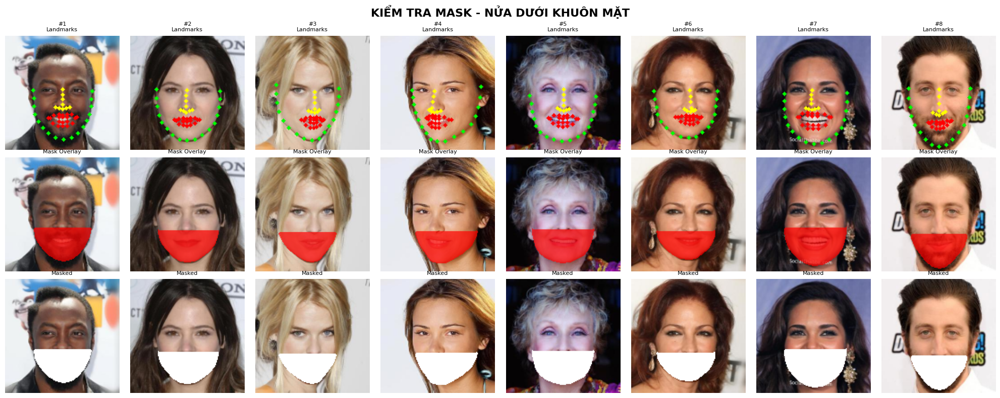


📊 Mask Statistics (ảnh cuối):
   Area: 10.7% (chuẩn: 20-35%)
   Center Y: 79.0% (chuẩn: 60-75%)
   ❌ CẦN ĐIỀU CHỈNH


In [21]:
def quick_test_mask():
    """Test nhanh mask trên vài ảnh"""
    print("\n🔍 QUICK TEST - KIỂM TRA MASK")
    
    paths = glob(os.path.join(config.CELEBA_PATH, '*.jpg'))[:8]
    
    landmark_detector = LandmarkDetector()
    mask_generator = MaskGenerator(img_size=config.IMG_SIZE)
    
    fig, axs = plt.subplots(3, 8, figsize=(20, 8))
    fig.suptitle('KIỂM TRA MASK - NỬA DƯỚI KHUÔN MẶT', fontsize=16, fontweight='bold')
    
    for i, path in enumerate(paths):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (config.IMG_SIZE, config.IMG_SIZE))
        
        # Detect landmarks TRÊN ẢNH 128x128
        landmarks = landmark_detector.detect(img)
        
        # Debug: print landmarks range
        if i == 0:
            print(f"Landmarks range: X=[{landmarks[:, 0].min():.1f}, {landmarks[:, 0].max():.1f}], "
                  f"Y=[{landmarks[:, 1].min():.1f}, {landmarks[:, 1].max():.1f}]")
        
        # Generate mask
        mask = mask_generator.generate_mask(img, landmarks)
        
        # Create overlay
        overlay = img.copy()
        mask_3ch = (mask / 255.0)[:, :, np.newaxis]
        overlay = (img * (1 - mask_3ch * 0.7) + 
                  np.array([255, 0, 0]) * mask_3ch * 0.7).astype(np.uint8)
        
        # Draw landmarks for debugging
        img_landmarks = img.copy()
        # Vẽ jaw màu xanh lá
        for j in range(17):
            cv2.circle(img_landmarks, (int(landmarks[j, 0]), int(landmarks[j, 1])), 2, (0, 255, 0), -1)
        # Vẽ mũi màu vàng
        for j in range(27, 36):
            cv2.circle(img_landmarks, (int(landmarks[j, 0]), int(landmarks[j, 1])), 2, (255, 255, 0), -1)
        # Vẽ miệng màu đỏ
        for j in range(48, 68):
            cv2.circle(img_landmarks, (int(landmarks[j, 0]), int(landmarks[j, 1])), 2, (255, 0, 0), -1)
        
        axs[0, i].imshow(img_landmarks)
        axs[0, i].set_title(f'#{i+1}\nLandmarks', fontsize=8)
        axs[0, i].axis('off')
        
        axs[1, i].imshow(overlay)
        axs[1, i].set_title('Mask Overlay', fontsize=8)
        axs[1, i].axis('off')
        
        masked = img.copy()
        masked[mask > 128] = 255
        axs[2, i].imshow(masked)
        axs[2, i].set_title('Masked', fontsize=8)
        axs[2, i].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(config.OUTPUT_DIR, 'mask_test_fixed.png'), dpi=150, bbox_inches='tight')
    plt.show()
    
    # Phân tích mask
    mask_area = (mask > 128).sum() / (config.IMG_SIZE ** 2) * 100
    y_coords = np.where(mask > 128)[0]
    mask_center_y = np.mean(y_coords) / config.IMG_SIZE * 100 if len(y_coords) > 0 else 0
    
    print(f"\n📊 Mask Statistics (ảnh cuối):")
    print(f"   Area: {mask_area:.1f}% (chuẩn: 20-35%)")
    print(f"   Center Y: {mask_center_y:.1f}% (chuẩn: 60-75%)")
    print(f"   {'✅ OK' if 20 < mask_area < 35 and 60 < mask_center_y < 75 else '❌ CẦN ĐIỀU CHỈNH'}")


if __name__ == "__main__":
    # Chạy test ngay
    quick_test_mask()

In [24]:
# ============================================================================
# TRAINING FUNCTION
# ============================================================================
def train_lightweight_model(cache_file, epochs=15):
    print("\n" + "="*60)
    print("LIGHTWEIGHT FACE RECONSTRUCTION TRAINING")
    print("="*60)

    if not os.path.exists(cache_file):
        raise FileNotFoundError(f"Cache file not found: {cache_file}")

    with h5py.File(cache_file, 'r') as f:
        total_samples = len(f['paths'])
        print(f"✅ Cache loaded: {total_samples} samples")

    total_indices = np.arange(total_samples)
    train_idx, val_idx = train_test_split(
        total_indices, test_size=0.1, random_state=42, shuffle=True
    )

    train_gen = DataGenerator(cache_file, indices=train_idx, 
                              batch_size=config.BATCH_SIZE, shuffle=True)
    val_gen = DataGenerator(cache_file, indices=val_idx,
                           batch_size=config.BATCH_SIZE, shuffle=False)

    print(f"📊 Train: {train_gen.n_samples} samples → {len(train_gen)} batches")
    print(f"📊 Val:   {val_gen.n_samples} samples → {len(val_gen)} batches")

    os.makedirs(config.WEIGHTS_DIR, exist_ok=True)
    latest_checkpoint = os.path.join(config.WEIGHTS_DIR, 'lightweight_gen_latest.weights.h5')
    best_checkpoint = os.path.join(config.WEIGHTS_DIR, 'lightweight_gen_best.weights.h5')

    gan = LightweightGAN()
    best_val_loss = float('inf')

    if os.path.exists(latest_checkpoint):
        print(f"📂 Resuming from {latest_checkpoint}")
        gan.generator.load_weights(latest_checkpoint)
    else:
        print("🆕 Starting from scratch")

    for epoch in range(epochs):
        print(f"\n{'='*20} Epoch {epoch+1}/{epochs} {'='*20}")

        # Training
        train_losses = []
        for real, gen_in, mask in tqdm(train_gen, desc="Training"):
            losses = gan.train_step(real, gen_in, mask)
            train_losses.append(losses['gen_loss'].numpy())
        avg_train_loss = np.mean(train_losses)

        # Validation
        val_losses = []
        for real, gen_in, mask in tqdm(val_gen, desc="Validation", leave=False):
            generated = gan.generator(gen_in, training=False)
            fake_out = gan.discriminator(generated, training=False)
            
            gen_adv = gan.bce_loss(tf.ones_like(fake_out), fake_out)
            gen_l1 = gan.mae_loss(real, generated)
            gen_perc = gan.perceptual_loss(real, generated)
            
            masks_3ch = tf.expand_dims(mask, -1) / 255.0
            masks_3ch = tf.tile(masks_3ch, [1, 1, 1, 3])
            masked_l1 = tf.reduce_mean(tf.abs((real - generated) * masks_3ch))
            
            val_loss = (config.WEIGHT_ADV * gen_adv + config.WEIGHT_L1 * gen_l1 +
                       config.WEIGHT_PERCEPTUAL * gen_perc + config.WEIGHT_MASKED * masked_l1)
            val_losses.append(val_loss.numpy())
        avg_val_loss = np.mean(val_losses)

        print(f"📈 Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

        # --- Save checkpoints ---
        gan.generator.save_weights(latest_checkpoint)  # Luôn save latest

        if (epoch + 1) % 5 == 0:
            milestone_path = os.path.join(config.WEIGHTS_DIR, f'generator_epoch_{epoch+1}.weights.h5')
            gan.generator.save_weights(milestone_path)
            print(f"💾 Saved milestone: epoch {epoch+1}")

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            gan.generator.save_weights(best_checkpoint)
            print(f"🏆 New best model! (val_loss: {best_val_loss:.4f})")

    print("\n🎉 Training completed!")
    print(f"Best model: {best_checkpoint}")
    print(f"Latest model: {latest_checkpoint}")

    return gan

In [25]:
if __name__ == "__main__":
    print("🚀 Face Reconstruction with Prior Integration")
    print("GPU:", tf.config.list_physical_devices('GPU'))
    
    pipeline = DataPipeline()
    paths = pipeline.load_paths(max_images=config.MAX_IMAGES)
    print(f"✅ Loaded {len(paths)} image paths")
    
    # Cache (chỉ chạy lần đầu)
    if not os.path.exists(pipeline.cache_file):
        pipeline.precompute_and_cache(paths)
    else:
        print(f"✅ Cache already exists: {pipeline.cache_file}")
        

    # Bắt đầu training với cache
    gan = train_lightweight_model(pipeline.cache_file, epochs=15)

🚀 Face Reconstruction with Prior Integration
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
✅ Loaded 30000 image paths
Precomputing 30000 images at 128x128...


Caching: 100%|██████████| 30000/30000 [10:35<00:00, 47.23it/s]
I0000 00:00:1767855499.582723      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1767855499.586691      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


✅ Cache completed: /kaggle/working/cache/priors_cache_128.h5

LIGHTWEIGHT FACE RECONSTRUCTION TRAINING
✅ Cache loaded: 30000 samples
📊 Train: 27000 samples → 844 batches
📊 Val:   3000 samples → 94 batches
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

📊 Model Statistics:
Generator params: 2,592,547
Discriminator params: 54,497
🆕 Starting from scratch

==================== Epoch 1/15 ====================


Training:   0%|          | 0/844 [00:00<?, ?it/s]E0000 00:00:1767855511.619063      55 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inlightweight_generator_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1767855512.797013     148 cuda_dnn.cc:529] Loaded cuDNN version 91002
Training: 100%|██████████| 844/844 [06:42<00:00,  2.10it/s]


📈 Train Loss: 22.6792 | Val Loss: 23.8083
🏆 New best model! (val_loss: 23.8083)

==================== Epoch 2/15 ====================


Training: 100%|██████████| 844/844 [06:19<00:00,  2.23it/s]


📈 Train Loss: 15.3091 | Val Loss: 12.3411
🏆 New best model! (val_loss: 12.3411)

==================== Epoch 3/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 13.5562 | Val Loss: 11.2906
🏆 New best model! (val_loss: 11.2906)

==================== Epoch 4/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 12.4518 | Val Loss: 10.8058
🏆 New best model! (val_loss: 10.8058)

==================== Epoch 5/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 11.7666 | Val Loss: 10.2654
💾 Saved milestone: epoch 5
🏆 New best model! (val_loss: 10.2654)

==================== Epoch 6/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 11.4648 | Val Loss: 11.2790

==================== Epoch 7/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.9667 | Val Loss: 9.8132
🏆 New best model! (val_loss: 9.8132)

==================== Epoch 8/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.3272 | Val Loss: 9.4127
🏆 New best model! (val_loss: 9.4127)

==================== Epoch 9/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.0327 | Val Loss: 9.2866
🏆 New best model! (val_loss: 9.2866)

==================== Epoch 10/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 9.8078 | Val Loss: 9.3089
💾 Saved milestone: epoch 10

==================== Epoch 11/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 9.5771 | Val Loss: 9.0074
🏆 New best model! (val_loss: 9.0074)

==================== Epoch 13/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.0908 | Val Loss: 9.0118

==================== Epoch 14/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.6169 | Val Loss: 11.5609

==================== Epoch 15/15 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.1910 | Val Loss: 9.0714
💾 Saved milestone: epoch 15

🎉 Training completed!
Best model: /kaggle/working/weights/lightweight_gen_best.weights.h5
Latest model: /kaggle/working/weights/lightweight_gen_latest.weights.h5


In [39]:
# ============================================================================
# CONTINUE TRAINING - TRAIN TIẾP TỪ CHECKPOINT
# ============================================================================

def continue_training(cache_file, additional_epochs=15, 
                     checkpoint_path=None, start_epoch=0):
    """
    Train tiếp từ checkpoint đã lưu
    
    Args:
        cache_file: đường dẫn cache HDF5
        additional_epochs: số epoch muốn train thêm
        checkpoint_path: đường dẫn checkpoint muốn load (mặc định: latest)
        start_epoch: epoch bắt đầu (để đánh số đúng)
    """
    print("\n" + "="*60)
    print("CONTINUE TRAINING FROM CHECKPOINT")
    print("="*60)

    if not os.path.exists(cache_file):
        raise FileNotFoundError(f"Cache file not found: {cache_file}")

    # Load data generators
    with h5py.File(cache_file, 'r') as f:
        total_samples = len(f['paths'])
        print(f"✅ Cache loaded: {total_samples} samples")

    total_indices = np.arange(total_samples)
    train_idx, val_idx = train_test_split(
        total_indices, test_size=0.1, random_state=42, shuffle=True
    )

    train_gen = DataGenerator(cache_file, indices=train_idx, 
                              batch_size=config.BATCH_SIZE, shuffle=True)
    val_gen = DataGenerator(cache_file, indices=val_idx,
                           batch_size=config.BATCH_SIZE, shuffle=False)

    print(f"📊 Train: {train_gen.n_samples} samples")
    print(f"📊 Val:   {val_gen.n_samples} samples")

    # Khởi tạo GAN
    gan = LightweightGAN()
    
    # Load checkpoint
    if checkpoint_path is None:
        checkpoint_path = os.path.join(config.WEIGHTS_DIR, 'lightweight_gen_latest.weights.h5')
    
    if os.path.exists(checkpoint_path):
        print(f"\n📂 Loading checkpoint: {checkpoint_path}")
        gan.generator.load_weights(checkpoint_path)
        print("✅ Checkpoint loaded successfully!")
    else:
        print(f"⚠️  Checkpoint not found: {checkpoint_path}")
        print("Starting from scratch...")
    
    # Checkpoint paths
    latest_checkpoint = os.path.join(config.WEIGHTS_DIR, 'lightweight_gen_latest.weights.h5')
    best_checkpoint = os.path.join(config.WEIGHTS_DIR, 'lightweight_gen_best.weights.h5')
    
    # Load best val loss nếu có
    best_val_loss = float('inf')
    history_file = os.path.join(config.WEIGHTS_DIR, 'training_history.txt')
    if os.path.exists(history_file):
        with open(history_file, 'r') as f:
            lines = f.readlines()
            if len(lines) > 0:
                try:
                    best_val_loss = float(lines[-1].split('best_val_loss=')[1].strip())
                    print(f"📈 Previous best val_loss: {best_val_loss:.4f}")
                except:
                    pass
    
    # Training loop
    total_epochs = start_epoch + additional_epochs
    
    for epoch in range(start_epoch, total_epochs):
        print(f"\n{'='*20} Epoch {epoch+1}/{total_epochs} {'='*20}")

        # Training
        train_losses = []
        for real, gen_in, mask in tqdm(train_gen, desc="Training"):
            losses = gan.train_step(real, gen_in, mask)
            train_losses.append(losses['gen_loss'].numpy())
        avg_train_loss = np.mean(train_losses)

        # Validation
        val_losses = []
        for real, gen_in, mask in tqdm(val_gen, desc="Validation", leave=False):
            generated = gan.generator(gen_in, training=False)
            fake_out = gan.discriminator(generated, training=False)
            
            gen_adv = gan.bce_loss(tf.ones_like(fake_out), fake_out)
            gen_l1 = gan.mae_loss(real, generated)
            gen_perc = gan.perceptual_loss(real, generated)
            
            masks_3ch = tf.expand_dims(mask, -1) / 255.0
            masks_3ch = tf.tile(masks_3ch, [1, 1, 1, 3])
            masked_l1 = tf.reduce_mean(tf.abs((real - generated) * masks_3ch))
            
            val_loss = (config.WEIGHT_ADV * gen_adv + config.WEIGHT_L1 * gen_l1 +
                       config.WEIGHT_PERCEPTUAL * gen_perc + config.WEIGHT_MASKED * masked_l1)
            val_losses.append(val_loss.numpy())
        avg_val_loss = np.mean(val_losses)

        print(f"📈 Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

        # Save checkpoints
        gan.generator.save_weights(latest_checkpoint)

        if (epoch + 1) % 5 == 0:
            milestone_path = os.path.join(config.WEIGHTS_DIR, f'generator_epoch_{epoch+1}.weights.h5')
            gan.generator.save_weights(milestone_path)
            print(f"💾 Saved milestone: epoch {epoch+1}")

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            gan.generator.save_weights(best_checkpoint)
            print(f"🏆 New best model! (val_loss: {best_val_loss:.4f})")
            
            # Save best val loss to history
            with open(history_file, 'a') as f:
                f.write(f"epoch={epoch+1}, best_val_loss={best_val_loss:.4f}\n")

    print("\n🎉 Training completed!")
    print(f"Best model: {best_checkpoint}")
    print(f"Latest model: {latest_checkpoint}")

    return gan



CONTINUE TRAINING FROM CHECKPOINT
✅ Cache loaded: 30000 samples
📊 Train: 27000 samples
📊 Val:   3000 samples

📊 Model Statistics:
Generator params: 2,592,547
Discriminator params: 54,497

📂 Loading checkpoint: /kaggle/working/weights/lightweight_gen_latest.weights.h5
✅ Checkpoint loaded successfully!

==================== Epoch 16/30 ====================


Training: 100%|██████████| 844/844 [06:34<00:00,  2.14it/s]


📈 Train Loss: 9.2494 | Val Loss: 7.7227
🏆 New best model! (val_loss: 7.7227)

==================== Epoch 17/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 9.1039 | Val Loss: 7.1589
🏆 New best model! (val_loss: 7.1589)

==================== Epoch 18/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 9.0055 | Val Loss: 9.1179

==================== Epoch 19/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 8.8917 | Val Loss: 7.1943

==================== Epoch 20/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 8.7565 | Val Loss: 7.5673
💾 Saved milestone: epoch 20

==================== Epoch 21/30 ====================


Training: 100%|██████████| 844/844 [06:19<00:00,  2.22it/s]


📈 Train Loss: 9.3853 | Val Loss: 9.3300

==================== Epoch 22/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.1191 | Val Loss: 19.3547

==================== Epoch 23/30 ====================


Training: 100%|██████████| 844/844 [06:17<00:00,  2.23it/s]


📈 Train Loss: 10.5377 | Val Loss: 13.5296

==================== Epoch 24/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.4093 | Val Loss: 30.4197

==================== Epoch 25/30 ====================


Training: 100%|██████████| 844/844 [06:17<00:00,  2.23it/s]


📈 Train Loss: 10.4806 | Val Loss: 28.9831
💾 Saved milestone: epoch 25

==================== Epoch 26/30 ====================


Training: 100%|██████████| 844/844 [06:17<00:00,  2.24it/s]


📈 Train Loss: 10.4283 | Val Loss: 42.2880

==================== Epoch 27/30 ====================


Training: 100%|██████████| 844/844 [06:17<00:00,  2.23it/s]


📈 Train Loss: 10.5165 | Val Loss: 11.5894

==================== Epoch 28/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.8663 | Val Loss: 9.4994

==================== Epoch 29/30 ====================


Training: 100%|██████████| 844/844 [06:18<00:00,  2.23it/s]


📈 Train Loss: 10.9984 | Val Loss: 21.2615

==================== Epoch 30/30 ====================


Training: 100%|██████████| 844/844 [06:17<00:00,  2.24it/s]


📈 Train Loss: 11.0546 | Val Loss: 9.7095
💾 Saved milestone: epoch 30

🎉 Training completed!
Best model: /kaggle/working/weights/lightweight_gen_best.weights.h5
Latest model: /kaggle/working/weights/lightweight_gen_latest.weights.h5

🎨 Visualizing reconstruction results...


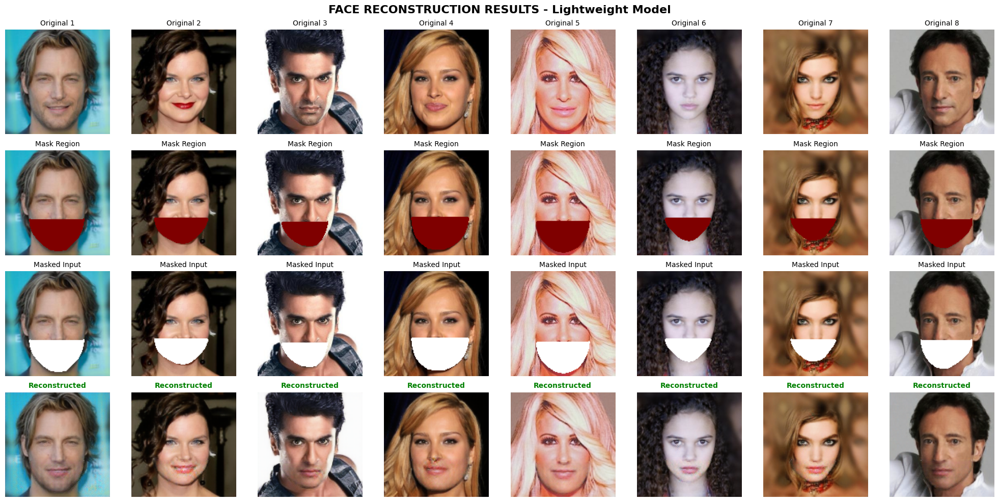


📊 Reconstruction Metrics:
  MAE:  3.83
  MSE:  54.02
  PSNR: 30.81 dB


In [40]:
if __name__ == "__main__":
    # Sau khi train xong 15 epochs, muốn train thêm 15 epochs:
    
    pipeline = DataPipeline()
    
    # Train tiếp 15 epochs nữa
    gan = continue_training(
        cache_file=pipeline.cache_file,
        additional_epochs=15,
        start_epoch=15  # Epoch bắt đầu là 16 (sau 15 epochs trước)
    )
    
    # Visualize kết quả
    visualize_reconstruction_results(gan, pipeline.cache_file, num_samples=8)

In [ ]:
import os

# XÓA CACHE CŨ BỊ LỖI
if os.path.exists(pipeline.cache_file):
    os.remove(pipeline.cache_file)
    print("🗑️ Đã xóa cache cũ bị lỗi")

# TẢI LẠI PATHS VÀ TẠO CACHE MỚI
paths = pipeline.load_paths(max_images=config.MAX_IMAGES)
pipeline.precompute_and_cache(paths)
print("✅ Đang tạo cache mới... (mất ~45-60 phút)")

✅ Đã load best model từ epoch tốt nhất: /kaggle/working/weights/lightweight_gen_best.weights.h5


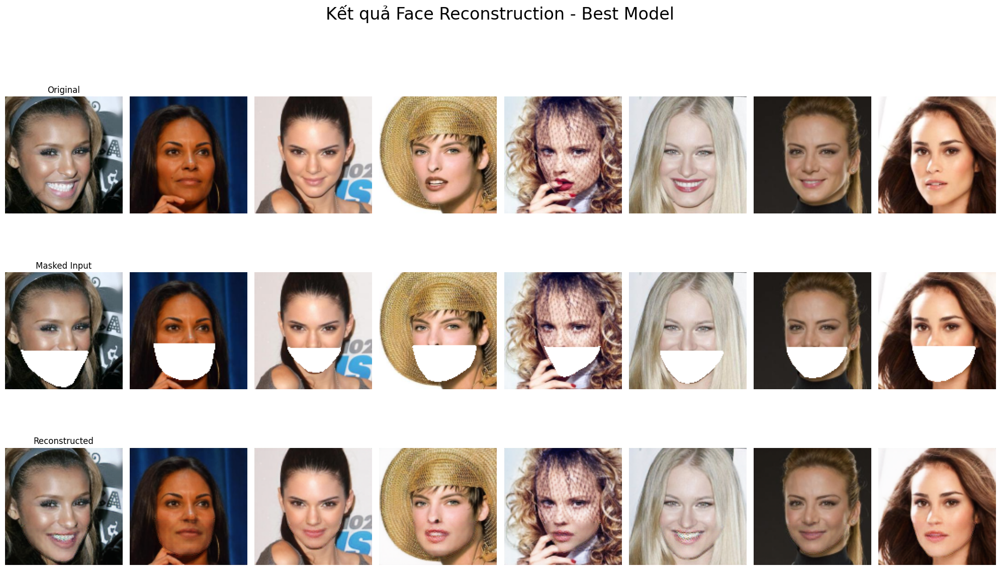

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import h5py
from sklearn.model_selection import train_test_split

# ===== 1. Load best model =====
generator = build_lightweight_generator(input_shape=(128, 128, 7))

best_checkpoint = os.path.join(config.WEIGHTS_DIR, 'lightweight_gen_best.weights.h5')
if os.path.exists(best_checkpoint):
    generator.load_weights(best_checkpoint)
    print(f"✅ Đã load best model từ epoch tốt nhất: {best_checkpoint}")
else:
    raise FileNotFoundError("Không tìm thấy generator_best.weights.h5")

# ===== 2. Lấy 8 ảnh ngẫu nhiên từ cache =====
with h5py.File(pipeline.cache_file, 'r') as f:
    total_samples = len(f['paths'])

total_indices = np.arange(total_samples)
np.random.seed(21)  # để kết quả giống nhau mỗi lần chạy
selected_indices = np.random.choice(total_indices, size=8, replace=False)

test_gen_small = DataGenerator(
    pipeline.cache_file,
    indices=selected_indices,
    batch_size=8,
    shuffle=False
)

# Lấy batch
for real, gen_in, mask in test_gen_small:
    break

# Dự đoán
reconstructed = generator(gen_in, training=False)

# ===== 3. Denorm hàm =====
def denorm(img):
    img = (img + 1) * 127.5
    return np.clip(img, 0, 255).astype(np.uint8)

# Sửa ở đây: bỏ .numpy()
orig_imgs   = denorm(real)                    # Ground truth
masked_imgs = denorm(gen_in[..., :3])          # Input masked
recon_imgs  = denorm(reconstructed)            # Reconstructed

# ===== 4. Visualize =====
plt.figure(figsize=(20, 12))
plt.suptitle("Kết quả Face Reconstruction - Best Model", fontsize=24, y=1.02)

for i in range(8):
    plt.subplot(3, 8, i + 1)
    plt.imshow(orig_imgs[i])
    plt.title("Original" if i == 0 else "")
    plt.axis('off')
    
    plt.subplot(3, 8, i + 9)
    plt.imshow(masked_imgs[i])
    plt.title("Masked Input" if i == 0 else "")
    plt.axis('off')
    
    plt.subplot(3, 8, i + 17)
    plt.imshow(recon_imgs[i])
    plt.title("Reconstructed" if i == 0 else "")
    plt.axis('off')

plt.tight_layout()
plt.show()